# Init

In [1]:
# imports
import pandas as pd
import numpy as np
import mne
import re
import os

from mne.preprocessing import (
    ICA, 
    create_ecg_epochs, 
    corrmap, 
    create_eog_epochs
)

# mne graphics config
from PySide6 import QtCore, QtGui, QtWidgets, __version__ 
%matplotlib qt

# Nicer plotting settings for vscode
# plt.rcParams["figure.dpi"] = 100

In [2]:
class SubjectICA:
    def __init__(self, data_path):
        self.data_path = data_path
        self.session = None
        self.id_n_s = data_path.strip('/')
        self.rawa = None
        self.rawb = None
        self.events_a=None
        self.events_b=None
        self.e_a=None
        self.e_b=None
        self.filt_rawa=None
        self.filt_rawb=None
        self.epochs_a =None
        self.epochs_b =None
        self.pos_files={}
        self.ica_a=None
        self.ica_b=None

    def load_data(self):
        pattern = r'(\d{2})$'
        match = re.search(pattern, self.id_n_s)
        print(match.group(1))
        if match.group(1)=='01':
            print('session 1: ')
            self.rawa = mne.io.read_raw_brainvision(self.data_path + self.id_n_s+'_pos1a.vhdr', preload=True, verbose="warning")
            self.rawb = mne.io.read_raw_brainvision(self.data_path + self.id_n_s+'_pos1b.vhdr', preload=True, verbose="warning")
            self.session = 1
        elif match.group(1)=='02':
            print('session 2: ')
            self.rawa = mne.io.read_raw_brainvision(self.data_path + self.id_n_s+'_pos2a.vhdr', preload=True, verbose="warning")
            self.rawb = mne.io.read_raw_brainvision(self.data_path + self.id_n_s+'_pos2b.vhdr', preload=True, verbose="warning")
            self.session = 2

        # get events and times
        # first posner (a)
        self.events_a = mne.events_from_annotations(self.rawa)
        # second posner (b)
        self.events_b = mne.events_from_annotations(self.rawb)
        # get posner file names
        self.get_posner_csv()
        # relabel stim events with validity information
        posa = str(self.session)+"a"
        posb = str(self.session)+"b"
        self.events_a = self.relabel_events(self.pos_files[posa], self.rawa)
        self.events_b = self.relabel_events(self.pos_files[posb], self.rawb)

        self.e_a = self.events_a
        self.e_b = self.events_b

        # all rows with fixation (code 40)
        e_40_a = self.e_a[self.e_a[:, 2] == 40]
        # all rows with trial end (code 101)
        e_101_a = self.e_a[self.e_a[:,2]==101]

        # all rows with fixation (code 40)
        e_40_b = self.e_b[self.e_b[:, 2] == 40]
        # all rows with trial end (code 101)
        e_101_b = self.e_b[self.e_b[:,2]==101]

        a_tmin= e_40_a[0][0]/1000
        a_tmax= e_101_a[-1][0]/1000

        b_tmin= e_40_b[0][0]/1000
        b_tmax= e_101_b[-1][0]/1000

        # Filter
        self.filt_rawa = self.rawa.crop(tmin=a_tmin, tmax=a_tmax).copy().filter(l_freq=1.0, h_freq=40)
        self.filt_rawb = self.rawb.crop(tmin=b_tmin, tmax=b_tmax).copy().filter(l_freq=1.0, h_freq=40)

        self.epochs_a = mne.Epochs(self.filt_rawa, 
                            self.e_a, 
                            event_id=None, 
                            tmin=-0.2, 
                            tmax=0.5, 
                            preload=True, 
                            detrend=0,
                            baseline=(None, 0))

        self.epochs_b = mne.Epochs(self.filt_rawb, 
                            self.e_b, 
                            event_id=None, 
                            tmin=-0.2, 
                            tmax=0.5, 
                            preload=True, 
                            detrend=0,
                            baseline=(None, 0))
    
    def get_posner_csv(self):
        # Define the target strings
        target_strings = ['1a', '1b', '2a', '2b']
        # Perform the recursive search for each target string
        for target_string in target_strings:
            result = self.csv_search(self.data_path, target_string)
            if result is not None:
                print(f"Found '{target_string}' in file: {result}")
                self.pos_files[target_string]=result
        
    def csv_search(self, directory, target_string):
        # Iterate over all files and directories in the given directory
        for root, dirs, files in os.walk(directory):
            for file in files:
                if file.endswith('.csv') and target_string in file:
                    file_path = os.path.join(root, file)
                    return file_path

        # If the target string is not found in any CSV file
        return None
    
    def relabel_events(self, pos_file, raw):
        print("relabelling events for ", pos_file)
        # get posner file names
        # Read posner data
        posner_csv = pd.read_csv(pos_file)
        posner_csv = posner_csv[["block_name", "cue_dir", "stim_pos", "session", "valid_cue"]]
        validity = posner_csv[posner_csv["block_name"]=="trials"]["valid_cue"].to_numpy()

        # get events 
        events, event_id = mne.events_from_annotations(raw) # get events
        idx = 0 # stim even idx increment

        for i, e in enumerate(events):
            code=e[2]
            # If stim
            if(code==50):
                if validity[idx]:
                    # Give code 51 if valid
                    events[i][2]=51
                idx+=1
            if(code==51):
                # Change code 51 (end of stim) to 52
                events[i][2]=52
        return events

    def ica(self, pos):
        # Fitting ICA
        if(pos==1):
            self.ica_a = ICA(n_components=len(self.filt_rawa.ch_names)-1, max_iter="auto", random_state=999)
            self.ica_a.fit(self.filt_rawa)
        elif(pos==2):
            self.ica_b = ICA(n_components=len(self.filt_rawb.ch_names)-1, max_iter="auto", random_state=999)
            self.ica_b.fit(self.filt_rawb)
        else:
            print("Parameter 'pos' should be either 1 (first posner), or 2 (second posner)")


    def save(self):
        pass

## m_01_01

In [111]:
# Load data
# Specify the path to your BrainVision data
data_path = 'm_01_01/'
# Load the data
raw = mne.io.read_raw_brainvision(data_path + 'm_01_01_pos1a.vhdr', preload=True)

# get events and times
events = mne.events_from_annotations(raw)
e_ = events[0]
# all rows with fixation (code 40)
e_40 = e_[e_[:, 2] == 40]
# all rows with trial end (code 101)
e_101 = e_[e_[:,2]==101]

_tmin= e_40[0][0]/1000
_tmax= e_101[-1][0]/1000

# Filter
filt_raw = raw.crop(tmin=_tmin, tmax=_tmax).copy().filter(l_freq=1.0, h_freq=40)

epochs = mne.Epochs(filt_raw, 
                    e_, 
                    event_id=None, 
                    tmin=-0.2, 
                    tmax=0.5, 
                    preload=True, 
                    baseline=(None, 0))

Extracting parameters from m_01_01/m_01_01_pos1a.vhdr...
Setting channel info structure...
Reading 0 ... 860939  =      0.000 ...   860.939 secs...


/var/folders/2b/4tnqzv_x3x17pf4q1_n7m8h40000gn/T/ipykernel_68141/4017816422.py:5: RuntimeWarning: No coordinate information found for channels ['ECG']. Setting channel types to misc. To avoid this warning, set channel types explicitly.
  raw = mne.io.read_raw_brainvision(data_path + 'm_01_01_pos1a.vhdr', preload=True)


Used Annotations descriptions: ['New Segment/', 'Stimulus/S 10', 'Stimulus/S 30', 'Stimulus/S 40', 'Stimulus/S 50', 'Stimulus/S 51', 'Stimulus/S 60', 'Stimulus/S 70', 'Stimulus/S 80', 'Stimulus/S101', 'Stimulus/S109', 'Stimulus/S111']
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 40 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 40.00 Hz
- Upper transition bandwidth: 10.00 Hz (-6 dB cutoff frequency: 45.00 Hz)
- Filter length: 3301 samples (3.301 sec)



/var/folders/2b/4tnqzv_x3x17pf4q1_n7m8h40000gn/T/ipykernel_68141/4017816422.py:5: RuntimeWarning: Not setting position of 1 misc channel found in montage:
['ECG']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = mne.io.read_raw_brainvision(data_path + 'm_01_01_pos1a.vhdr', preload=True)
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s


Not setting metadata
414 matching events found
Setting baseline interval to [-0.2, 0.2] sec
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 414 events and 701 original time points ...
5 bad epochs dropped


[Parallel(n_jobs=1)]: Done  63 out of  63 | elapsed:    0.7s finished


In [19]:
# %matplotlib qt
# epochs.plot(events = events[0])

In [8]:
# Fitting ICA
ica = ICA(n_components=len(filt_raw.ch_names)-1, max_iter="auto", random_state=999)
ica.fit(filt_raw)
ica

Fitting ICA to data using 63 channels (please be patient, this may take a while)
Selecting by number: 63 components
Fitting ICA took 57.0s.


Method,fastica
Fit,64 iterations on raw data (691052 samples)
ICA components,63
Available PCA components,63
Channel types,eeg
ICA components marked for exclusion,—


Creating RawArray with float64 data, n_channels=63, n_times=691052
    Range : 30043 ... 721094 =     30.043 ...   721.094 secs
Ready.


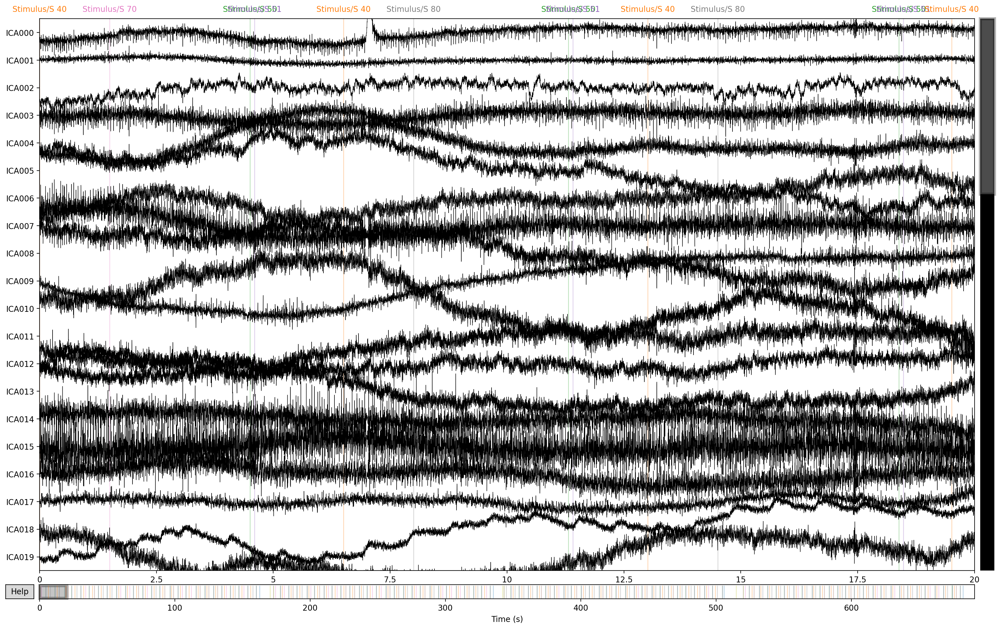

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
345 matching events found
No baseline correction applied
0 projection items activated
    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
345 matching events found
No baseline correction applied
0 projection items activated
    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
345 matching events found
No baseline correction applied
0 projection items activated
    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
345 matching events found
No baseline correction applied
0 projection items activated
    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
345 matching events found
No baseline correction applied
0 projection items activated
    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
345 matching events found
No baseline correction applied
0 projection items ac

In [ ]:
%matplotlib qt
ica.plot_sources(raw)

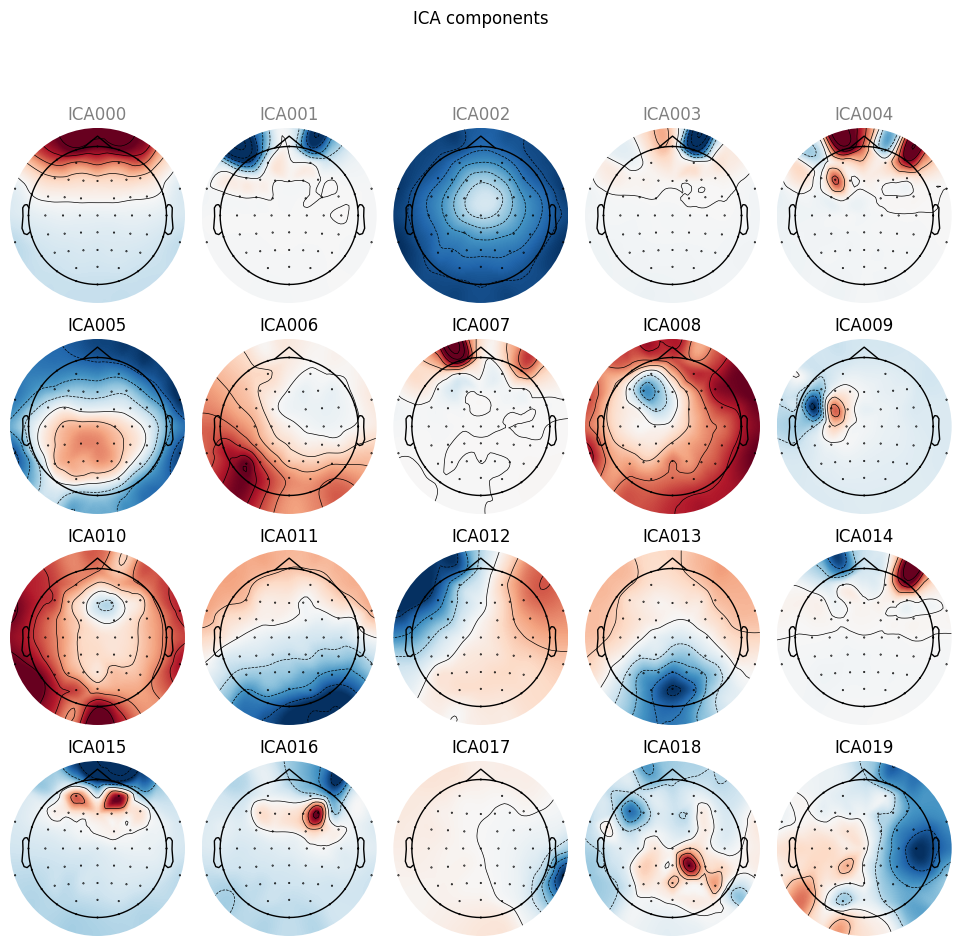

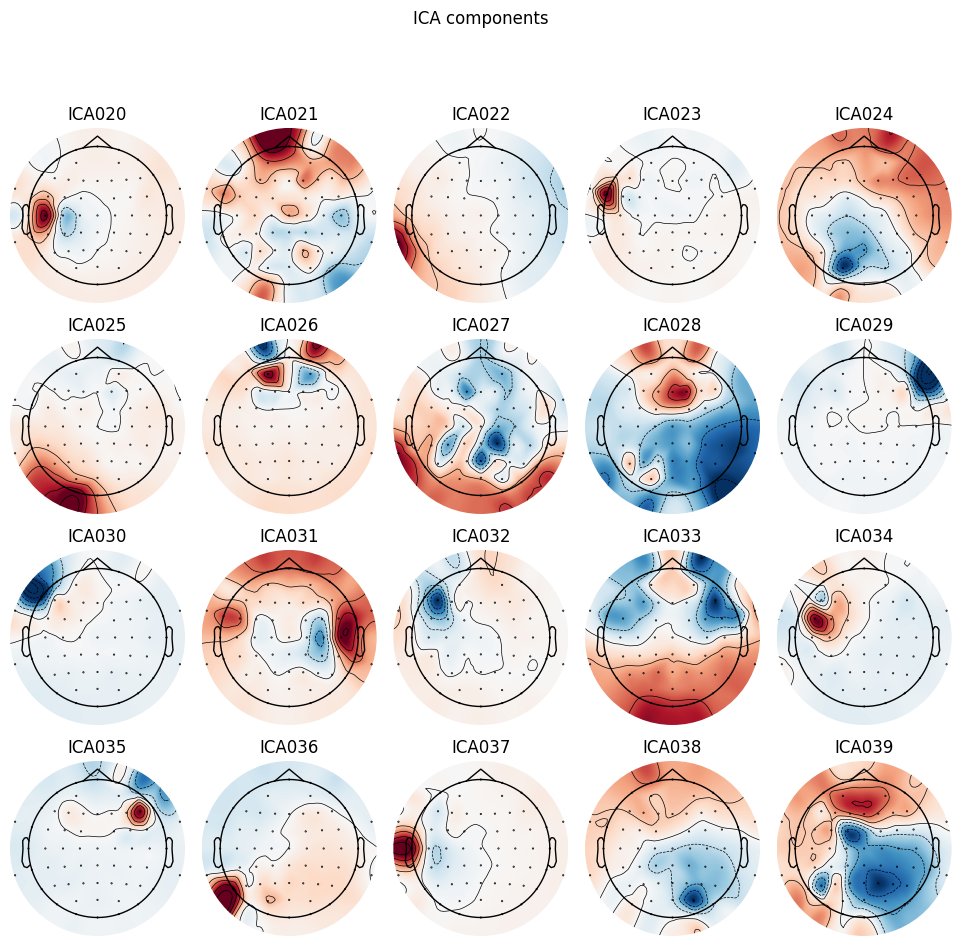

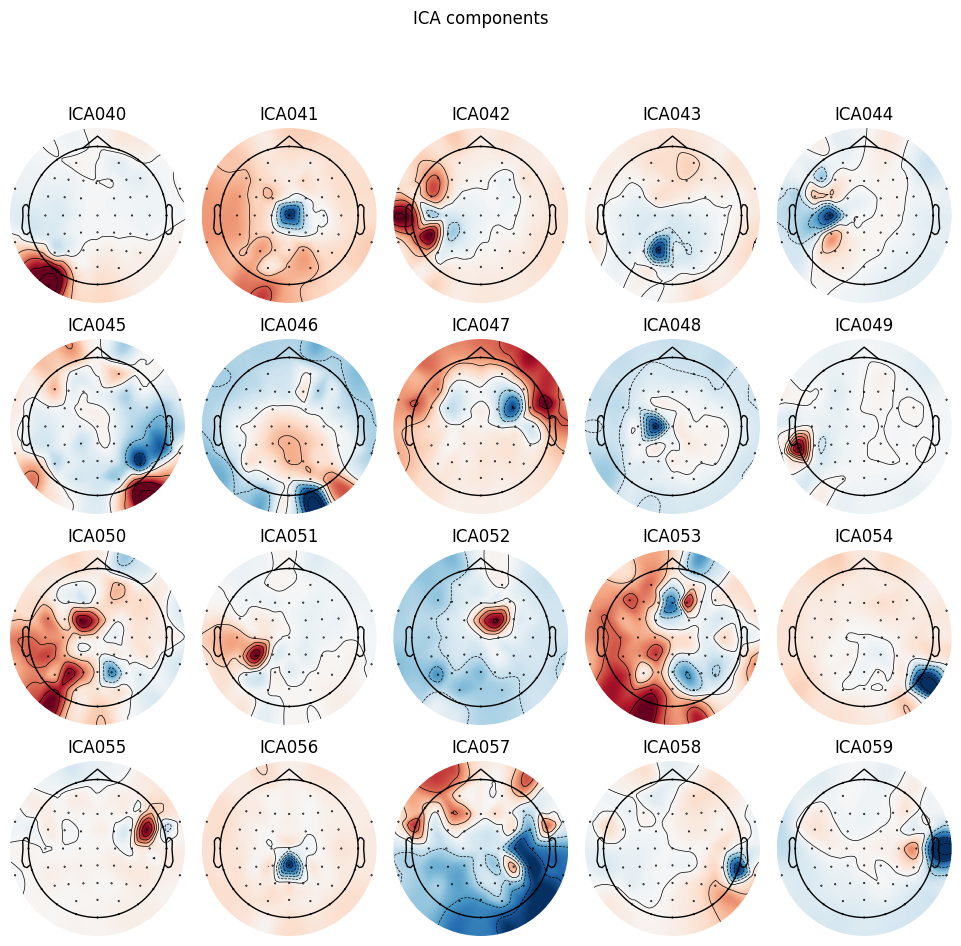

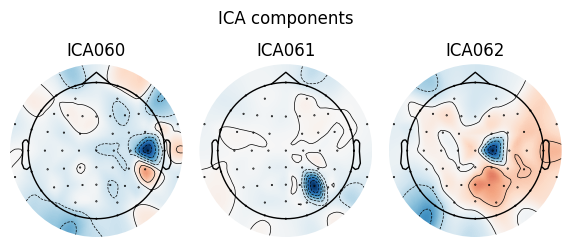

[<MNEFigure size 975x967 with 20 Axes>,
 <MNEFigure size 975x967 with 20 Axes>,
 <MNEFigure size 975x967 with 20 Axes>,
 <MNEFigure size 585x260.5 with 3 Axes>]

In [11]:
%matplotlib inline
ica.plot_components()

In [16]:
# Exclude some components
ica.exclude = [0, 1, 2, 3, 4]

Applying ICA to Raw instance
    Transforming to ICA space (63 components)
    Zeroing out 5 ICA components
    Projecting back using 63 PCA components


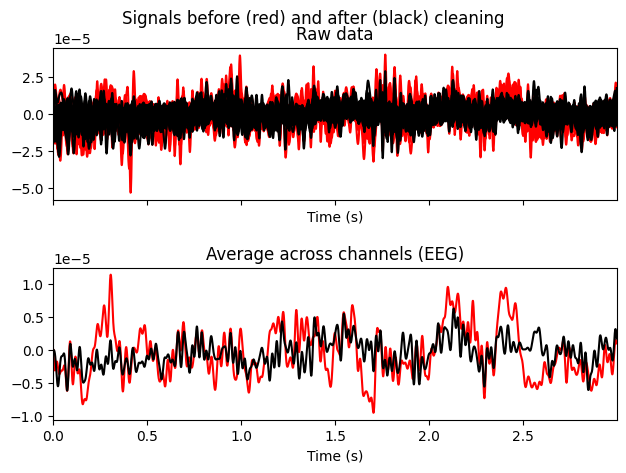

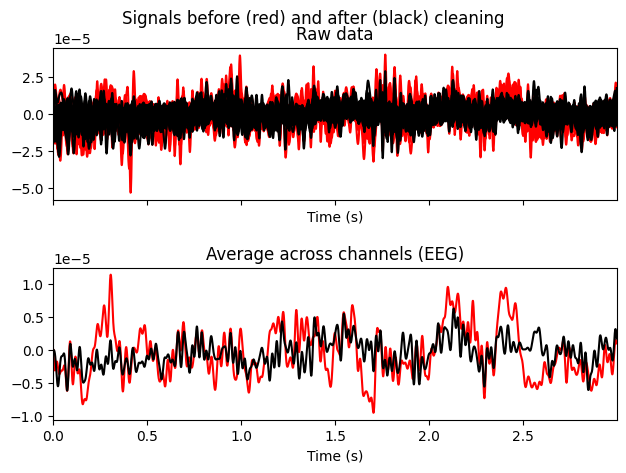

In [14]:
ica.plot_overlay(filt_raw, exclude=[0, 1, 2, 3, 4], picks="eeg")

In [17]:
cleaned_raw = filt_raw.copy()
ica.apply(cleaned_raw)

Applying ICA to Raw instance
    Transforming to ICA space (63 components)
    Zeroing out 5 ICA components
    Projecting back using 63 PCA components


<RawBrainVision | m_01_01_pos1a.eeg, 64 x 691052 (691.1 s), ~337.5 MB, data loaded>

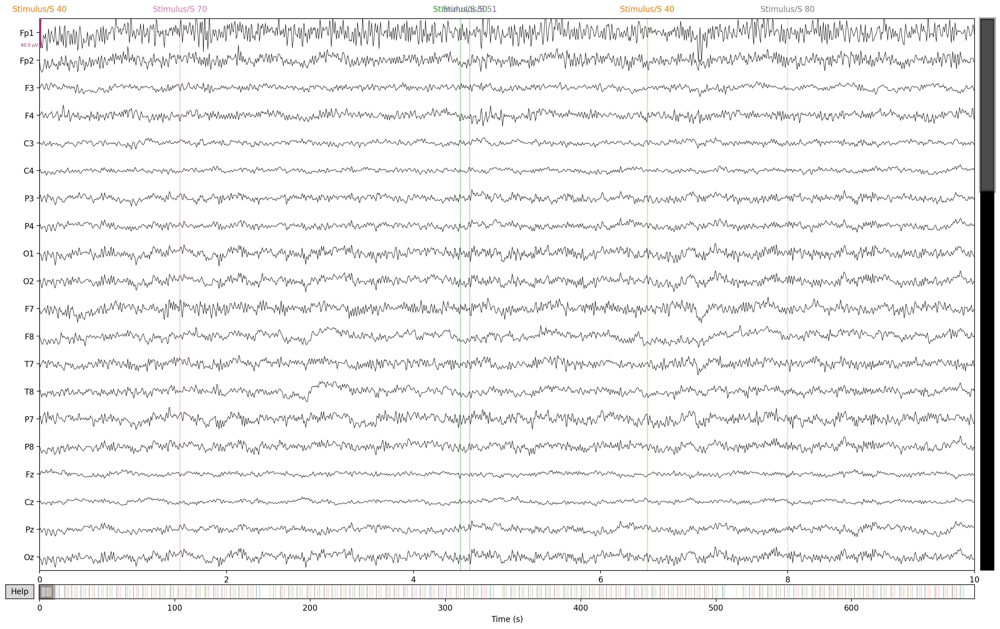

Channels marked as bad:
none


In [19]:
%matplotlib qt
cleaned_raw.plot()

In [23]:
cleaned_raw.save('cleaned/m_01_01.fif')

Writing /Users/babe/src/gla/dissertation/init_data_exploration/cleaned/m_01_01.fif


/var/folders/2b/4tnqzv_x3x17pf4q1_n7m8h40000gn/T/ipykernel_68141/3342493147.py:1: RuntimeWarning: This filename (/Users/babe/src/gla/dissertation/init_data_exploration/cleaned/m_01_01.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  cleaned_raw.save('cleaned/m_01_01.fif')


Closing /Users/babe/src/gla/dissertation/init_data_exploration/cleaned/m_01_01.fif
[done]


## m_01_02

In [163]:
m_01_02 = SubjectICA('m_01_02/')

In [164]:
m_01_02.load_data()

02
session 2: 


/var/folders/2b/4tnqzv_x3x17pf4q1_n7m8h40000gn/T/ipykernel_79155/1814811261.py:31: RuntimeWarning: No coordinate information found for channels ['ECG']. Setting channel types to misc. To avoid this warning, set channel types explicitly.
  self.rawa = mne.io.read_raw_brainvision(self.data_path + self.id_n_s+'_pos2a.vhdr', preload=True, verbose="warning")
/var/folders/2b/4tnqzv_x3x17pf4q1_n7m8h40000gn/T/ipykernel_79155/1814811261.py:31: RuntimeWarning: Not setting position of 1 misc channel found in montage:
['ECG']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  self.rawa = mne.io.read_raw_brainvision(self.data_path + self.id_n_s+'_pos2a.vhdr', preload=True, verbose="warning")
/var/folders/2b/4tnqzv_x3x17pf4q1_n7m8h40000gn/T/ipykernel_79155/1814811261.py:32: RuntimeWarning: No coordinate information found for channels ['ECG']. Setting channel types to mi

Used Annotations descriptions: ['New Segment/', 'Stimulus/S  1', 'Stimulus/S  5', 'Stimulus/S 10', 'Stimulus/S 11', 'Stimulus/S 20', 'Stimulus/S 30', 'Stimulus/S 40', 'Stimulus/S 50', 'Stimulus/S 51', 'Stimulus/S 60', 'Stimulus/S 70', 'Stimulus/S 80', 'Stimulus/S101', 'Stimulus/S109', 'Stimulus/S117']
Used Annotations descriptions: ['New Segment/', 'Stimulus/S 10', 'Stimulus/S 20', 'Stimulus/S 30', 'Stimulus/S 40', 'Stimulus/S 50', 'Stimulus/S 51', 'Stimulus/S 60', 'Stimulus/S 70', 'Stimulus/S 80', 'Stimulus/S101', 'Stimulus/S109', 'Stimulus/S117']
Found '2a' in file: m_01_02/01_2a_posner_task_2023-04-14_11h02.53.670/01_2a_posner_task_2023-04-14_11h02.53.670.csv
Found '2b' in file: m_01_02/01_2b_posner_task_2023-04-14_11h59.21.726/01_2b_posner_task_2023-04-14_11h59.21.726.csv
relabelling events for  m_01_02/01_2a_posner_task_2023-04-14_11h02.53.670/01_2a_posner_task_2023-04-14_11h02.53.670.csv
Used Annotations descriptions: ['New Segment/', 'Stimulus/S  1', 'Stimulus/S  5', 'Stimulus/S

/var/folders/2b/4tnqzv_x3x17pf4q1_n7m8h40000gn/T/ipykernel_79155/1814811261.py:32: RuntimeWarning: Not setting position of 1 misc channel found in montage:
['ECG']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  self.rawb = mne.io.read_raw_brainvision(self.data_path + self.id_n_s+'_pos2b.vhdr', preload=True, verbose="warning")


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 40 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 40.00 Hz
- Upper transition bandwidth: 10.00 Hz (-6 dB cutoff frequency: 45.00 Hz)
- Filter length: 3301 samples (3.301 sec)



[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  63 out of  63 | elapsed:    0.7s finished


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 40 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 40.00 Hz
- Upper transition bandwidth: 10.00 Hz (-6 dB cutoff frequency: 45.00 Hz)
- Filter length: 3301 samples (3.301 sec)



[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.1s remaining:    0.0s


Not setting metadata
418 matching events found
Setting baseline interval to [-0.2, 0.0] sec
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 418 events and 701 original time points ...


[Parallel(n_jobs=1)]: Done  63 out of  63 | elapsed:    0.7s finished


9 bad epochs dropped
Not setting metadata
413 matching events found
Setting baseline interval to [-0.2, 0.0] sec
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 413 events and 701 original time points ...


/Users/babe/src/gla/dissertation/init_data_exploration/nfb_analysis_env/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3464: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/babe/src/gla/dissertation/init_data_exploration/nfb_analysis_env/lib/python3.10/site-packages/numpy/core/_methods.py:184: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(


6 bad epochs dropped


/Users/babe/src/gla/dissertation/init_data_exploration/nfb_analysis_env/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3464: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/babe/src/gla/dissertation/init_data_exploration/nfb_analysis_env/lib/python3.10/site-packages/numpy/core/_methods.py:184: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(


In [7]:
m_01_02.ica(1)

Fitting ICA to data using 63 channels (please be patient, this may take a while)
Selecting by number: 63 components
Fitting ICA took 91.7s.


In [8]:
m_01_02.ica(2)

Fitting ICA to data using 63 channels (please be patient, this may take a while)
Selecting by number: 63 components
Fitting ICA took 87.8s.


In [9]:
%matplotlib qt
m_01_02.ica_a.plot_sources(m_01_02.filt_rawa)

Creating RawArray with float64 data, n_channels=63, n_times=687607
    Range : 290691 ... 978297 =    290.691 ...   978.297 secs
Ready.
Using matplotlib as 2D backend.


In [10]:
%matplotlib qt
m_01_02.ica_b.plot_sources(m_01_02.filt_rawb)

Creating RawArray with float64 data, n_channels=63, n_times=690071
    Range : 86357 ... 776427 =     86.357 ...   776.427 secs
Ready.


    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
345 matching events found
No baseline correction applied
0 projection items activated
    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
345 matching events found
No baseline correction applied
0 projection items activated
    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
345 matching events found
No baseline correction applied
0 projection items activated
    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
345 matching events found
No baseline correction applied
0 projection items activated
    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
345 matching events found
No baseline correction applied
0 projection items activated
    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
345 matching events found
No baseline correction applied
0 projection items ac

In [13]:
m_01_02.ica_b.plot_components()

[<MNEFigure size 1950x1934 with 20 Axes>,
 <MNEFigure size 1950x1934 with 20 Axes>,
 <MNEFigure size 1950x1934 with 20 Axes>,
 <MNEFigure size 1170x520 with 3 Axes>]

In [14]:
m_01_02.ica_b.excludes=[0,1,2,3,4]

In [15]:
m_01_02.ica_b.excludes=[0,1,2,3,4]

In [150]:
# m_01_02.filt_rawb.info['meas_date']
m_01_02.filt_rawb.info

<Info | 8 non-empty values
 bads: []
 ch_names: Fp1, Fp2, F3, F4, C3, C4, P3, P4, O1, O2, F7, F8, T7, T8, P7, ...
 chs: 63 EEG, 1 misc
 custom_ref_applied: False
 dig: 66 items (3 Cardinal, 63 EEG)
 highpass: 1.0 Hz
 lowpass: 40.0 Hz
 meas_date: 2023-04-14 11:59:54 UTC
 nchan: 64
 projs: []
 sfreq: 1000.0 Hz
>

In [212]:
m_01_02.events_b

array([[     0,      0,  99999],
       [ 78706,      0,     10],
       [ 86357,      0,     40],
       ...,
       [776427,      0,    101],
       [785921,      0,    117],
       [785922,      0,     20]])

In [202]:
# raw.set_annotations(mne.Annotations(events[:, 0], [0] * len(events), events[:, 2]))

s_freq = m_01_02.filt_rawb.info['sfreq']
anno_from_events=mne.annotations_from_events(m_01_02.events_b,sfreq=s_freq,orig_time=m_01_02.filt_rawb.info['meas_date'])


In [206]:
m_01_02.rawb.set_annotations(anno_from_events, verbose=1)
m_01_02.rawb.save("test_raw.fif", overwrite=True)

Cropping annotations 2023-04-14 12:01:21.156840+00:00 - 2023-04-14 12:12:51.227840+00:00
  [0] Dropping (2023-04-14 11:59:54.799840+00:00 - 2023-04-14 11:59:54.799840+00:00: 99999)
  [1] Dropping (2023-04-14 12:01:13.505840+00:00 - 2023-04-14 12:01:13.505840+00:00: 10)
  [2] Keeping  (2023-04-14 12:01:21.156840+00:00 - 2023-04-14 12:01:21.156840+00:00 -> 86.357 - 86.357)
  [3] Keeping  (2023-04-14 12:01:22.656840+00:00 - 2023-04-14 12:01:22.656840+00:00 -> 87.857 - 87.857)
  [4] Keeping  (2023-04-14 12:01:26.506840+00:00 - 2023-04-14 12:01:26.506840+00:00 -> 91.707 - 91.707)
  [5] Keeping  (2023-04-14 12:01:26.606840+00:00 - 2023-04-14 12:01:26.606840+00:00 -> 91.807 - 91.807)
  [6] Keeping  (2023-04-14 12:01:27.656840+00:00 - 2023-04-14 12:01:27.656840+00:00 -> 92.857 - 92.857)
  [7] Keeping  (2023-04-14 12:01:29.156840+00:00 - 2023-04-14 12:01:29.156840+00:00 -> 94.357 - 94.357)
  [8] Keeping  (2023-04-14 12:01:31.776840+00:00 - 2023-04-14 12:01:31.776840+00:00 -> 96.977 - 96.977)
  

  [77] Keeping  (2023-04-14 12:03:22.786840+00:00 - 2023-04-14 12:03:22.786840+00:00 -> 207.987 - 207.987)
  [78] Keeping  (2023-04-14 12:03:24.667840+00:00 - 2023-04-14 12:03:24.667840+00:00 -> 209.868 - 209.868)
  [79] Keeping  (2023-04-14 12:03:26.167840+00:00 - 2023-04-14 12:03:26.167840+00:00 -> 211.368 - 211.368)
  [80] Keeping  (2023-04-14 12:03:29.467840+00:00 - 2023-04-14 12:03:29.467840+00:00 -> 214.668 - 214.668)
  [81] Keeping  (2023-04-14 12:03:29.567840+00:00 - 2023-04-14 12:03:29.567840+00:00 -> 214.768 - 214.768)
  [82] Keeping  (2023-04-14 12:03:31.167840+00:00 - 2023-04-14 12:03:31.167840+00:00 -> 216.368 - 216.368)
  [83] Keeping  (2023-04-14 12:03:32.667840+00:00 - 2023-04-14 12:03:32.667840+00:00 -> 217.868 - 217.868)
  [84] Keeping  (2023-04-14 12:03:35.737840+00:00 - 2023-04-14 12:03:35.737840+00:00 -> 220.938 - 220.938)
  [85] Keeping  (2023-04-14 12:03:35.837840+00:00 - 2023-04-14 12:03:35.837840+00:00 -> 221.038 - 221.038)
  [86] Keeping  (2023-04-14 12:03:37.

  [154] Keeping  (2023-04-14 12:05:29.327840+00:00 - 2023-04-14 12:05:29.327840+00:00 -> 334.528 - 334.528)
  [155] Keeping  (2023-04-14 12:05:32.197840+00:00 - 2023-04-14 12:05:32.197840+00:00 -> 337.398 - 337.398)
  [156] Keeping  (2023-04-14 12:05:32.297840+00:00 - 2023-04-14 12:05:32.297840+00:00 -> 337.498 - 337.498)
  [157] Keeping  (2023-04-14 12:05:34.327840+00:00 - 2023-04-14 12:05:34.327840+00:00 -> 339.528 - 339.528)
  [158] Keeping  (2023-04-14 12:05:35.827840+00:00 - 2023-04-14 12:05:35.827840+00:00 -> 341.028 - 341.028)
  [159] Keeping  (2023-04-14 12:05:39.127840+00:00 - 2023-04-14 12:05:39.127840+00:00 -> 344.328 - 344.328)
  [160] Keeping  (2023-04-14 12:05:39.227840+00:00 - 2023-04-14 12:05:39.227840+00:00 -> 344.428 - 344.428)
  [161] Keeping  (2023-04-14 12:05:40.828840+00:00 - 2023-04-14 12:05:40.828840+00:00 -> 346.029 - 346.029)
  [162] Keeping  (2023-04-14 12:05:42.327840+00:00 - 2023-04-14 12:05:42.327840+00:00 -> 347.528 - 347.528)
  [163] Keeping  (2023-04-14

  [230] Keeping  (2023-04-14 12:07:52.648840+00:00 - 2023-04-14 12:07:52.648840+00:00 -> 477.849 - 477.849)
  [231] Keeping  (2023-04-14 12:07:54.598840+00:00 - 2023-04-14 12:07:54.598840+00:00 -> 479.799 - 479.799)
  [232] Keeping  (2023-04-14 12:07:56.098840+00:00 - 2023-04-14 12:07:56.098840+00:00 -> 481.299 - 481.299)
  [233] Keeping  (2023-04-14 12:07:59.678840+00:00 - 2023-04-14 12:07:59.678840+00:00 -> 484.879 - 484.879)
  [234] Keeping  (2023-04-14 12:07:59.778840+00:00 - 2023-04-14 12:07:59.778840+00:00 -> 484.979 - 484.979)
  [235] Keeping  (2023-04-14 12:08:01.098840+00:00 - 2023-04-14 12:08:01.098840+00:00 -> 486.299 - 486.299)
  [236] Keeping  (2023-04-14 12:08:02.598840+00:00 - 2023-04-14 12:08:02.598840+00:00 -> 487.799 - 487.799)
  [237] Keeping  (2023-04-14 12:08:05.208840+00:00 - 2023-04-14 12:08:05.208840+00:00 -> 490.409 - 490.409)
  [238] Keeping  (2023-04-14 12:08:05.308840+00:00 - 2023-04-14 12:08:05.308840+00:00 -> 490.509 - 490.509)
  [239] Keeping  (2023-04-14

  [308] Keeping  (2023-04-14 12:10:05.657840+00:00 - 2023-04-14 12:10:05.657840+00:00 -> 610.858 - 610.858)
  [309] Keeping  (2023-04-14 12:10:06.711840+00:00 - 2023-04-14 12:10:06.711840+00:00 -> 611.912 - 611.912)
  [310] Keeping  (2023-04-14 12:10:08.209840+00:00 - 2023-04-14 12:10:08.209840+00:00 -> 613.41 - 613.41)
  [311] Keeping  (2023-04-14 12:10:12.019840+00:00 - 2023-04-14 12:10:12.019840+00:00 -> 617.22 - 617.22)
  [312] Keeping  (2023-04-14 12:10:12.119840+00:00 - 2023-04-14 12:10:12.119840+00:00 -> 617.32 - 617.32)
  [313] Keeping  (2023-04-14 12:10:13.219840+00:00 - 2023-04-14 12:10:13.219840+00:00 -> 618.42 - 618.42)
  [314] Keeping  (2023-04-14 12:10:14.719840+00:00 - 2023-04-14 12:10:14.719840+00:00 -> 619.92 - 619.92)
  [315] Keeping  (2023-04-14 12:10:17.609840+00:00 - 2023-04-14 12:10:17.609840+00:00 -> 622.81 - 622.81)
  [316] Keeping  (2023-04-14 12:10:17.709840+00:00 - 2023-04-14 12:10:17.709840+00:00 -> 622.91 - 622.91)
  [317] Keeping  (2023-04-14 12:10:19.7198

  [385] Keeping  (2023-04-14 12:12:10.250840+00:00 - 2023-04-14 12:12:10.250840+00:00 -> 735.451 - 735.451)
  [386] Keeping  (2023-04-14 12:12:11.750840+00:00 - 2023-04-14 12:12:11.750840+00:00 -> 736.951 - 736.951)
  [387] Keeping  (2023-04-14 12:12:14.260840+00:00 - 2023-04-14 12:12:14.260840+00:00 -> 739.461 - 739.461)
  [388] Keeping  (2023-04-14 12:12:14.360840+00:00 - 2023-04-14 12:12:14.360840+00:00 -> 739.561 - 739.561)
  [389] Keeping  (2023-04-14 12:12:16.750840+00:00 - 2023-04-14 12:12:16.750840+00:00 -> 741.951 - 741.951)
  [390] Keeping  (2023-04-14 12:12:18.250840+00:00 - 2023-04-14 12:12:18.250840+00:00 -> 743.451 - 743.451)
  [391] Keeping  (2023-04-14 12:12:21.560840+00:00 - 2023-04-14 12:12:21.560840+00:00 -> 746.761 - 746.761)
  [392] Keeping  (2023-04-14 12:12:21.660840+00:00 - 2023-04-14 12:12:21.660840+00:00 -> 746.861 - 746.861)
  [393] Keeping  (2023-04-14 12:12:23.250840+00:00 - 2023-04-14 12:12:23.250840+00:00 -> 748.451 - 748.451)
  [394] Keeping  (2023-04-14

/var/folders/2b/4tnqzv_x3x17pf4q1_n7m8h40000gn/T/ipykernel_79155/2717182849.py:1: RuntimeWarning: Omitted 4 annotation(s) that were outside data range.
  m_01_02.rawb.set_annotations(anno_from_events, verbose=1)


Closing /Users/babe/src/gla/dissertation/init_data_exploration/test_raw.fif
[done]


In [207]:
test = mne.io.read_raw_fif("test_raw.fif")

Opening raw data file test_raw.fif...
    Range : 86357 ... 776427 =     86.357 ...   776.427 secs
Ready.


/var/folders/2b/4tnqzv_x3x17pf4q1_n7m8h40000gn/T/ipykernel_79155/983473598.py:1: RuntimeWarning: Omitted 4 annotation(s) that were outside data range.
  m_01_02.rawb.set_annotations(mne.Annotations(onset=m_01_02.events_b[:, 0]/sfreq, duration=m_01_02.events_b[:,1], description=m_01_02.events_b[:, 2], orig_time=m_01_02.filt_rawb.info['meas_date']))


<RawBrainVision | m_01_02_pos2b.eeg, 64 x 690071 (690.1 s), ~337.0 MB, data loaded>

In [210]:
epochs, events = mne.events_from_annotations(test)

Used Annotations descriptions: ['101', '109', '30', '40', '50', '51', '52', '60', '70', '80']


In [211]:
for i in epochs:
    print(i)

[86357     0     4]
[87857     0    10]
[91707     0     6]
[91807     0     7]
[92857     0     4]
[94357     0     9]
[96977     0     6]
[97077     0     7]
[99357     0     4]
[100857      0      9]
[104187      0      6]
[104287      0      7]
[105857      0      4]
[107357      0     10]
[110227      0      6]
[110327      0      7]
[112357      0      4]
[113857      0     10]
[117077      0      6]
[117177      0      7]
[118857      0      4]
[120357      0      8]
[123627      0      6]
[123727      0      7]
[125357      0      4]
[126857      0     10]
[130487      0      6]
[130587      0      7]
[131867      0      4]
[133367      0      9]
[136997      0      5]
[137097      0      7]
[138367      0      4]
[139867      0     10]
[143637      0      6]
[143737      0      7]
[144867      0      4]
[146367      0      8]
[150207      0      5]
[150307      0      7]
[151367      0      4]
[152867      0      9]
[155567      0      6]
[155667      0      7]
[157867      0 

array([  0.   ,  78.706,  86.357,  87.857,  91.707,  91.807,  92.857,
        94.357,  96.977,  97.077,  99.357, 100.857, 104.187, 104.287,
       105.857, 107.357, 110.227, 110.327, 112.357, 113.857, 117.077,
       117.177, 118.857, 120.357, 123.627, 123.727, 125.357, 126.857,
       130.487, 130.587, 131.867, 133.367, 136.997, 137.097, 138.367,
       139.867, 143.637, 143.737, 144.867, 146.367, 150.207, 150.307,
       151.367, 152.867, 155.567, 155.667, 157.867, 159.367, 162.687,
       162.787, 164.367, 165.867, 169.247, 169.347, 170.868, 172.367,
       175.987, 176.087, 177.368, 178.867, 181.557, 181.657, 183.867,
       185.368, 188.218, 188.318, 190.368, 191.868, 194.697, 194.797,
       196.867, 198.368, 201.387, 201.487, 203.368, 204.868, 207.888,
       207.987, 209.868, 211.368, 214.668, 214.768, 216.368, 217.868,
       220.938, 221.038, 222.868, 224.368, 227.188, 227.288, 229.368,
       230.868, 234.158, 234.258, 235.868, 237.368, 240.508, 240.608,
       242.378, 243.

In [130]:
m_01_02.events_b[:,1]

413

In [134]:
m_01_02.events_b[:, 2]

array([99999,    10,    40,    80,    51,    52,    40,    70,    51,
          52,    40,    70,    51,    52,    40,    80,    51,    52,
          40,    80,    51,    52,    40,    60,    51,    52,    40,
          80,    51,    52,    40,    70,    50,    52,    40,    80,
          51,    52,    40,    60,    50,    52,    40,    70,    51,
          52,    40,    70,    51,    52,    40,    60,    50,    52,
          40,    70,    51,    52,    40,    60,    50,    52,    40,
          80,    50,    52,    40,    60,    51,    52,    40,    70,
          51,    52,    40,    80,    50,    52,    40,    70,    51,
          52,    40,    80,    51,    52,    40,    70,    51,    52,
          40,    60,    51,    52,    40,    70,    51,    52,    40,
          60,    51,    52,    30,   101,   109,    40,    80,    51,
          52,    40,    80,    51,    52,    40,    70,    50,    52,
          40,    60,    50,    52,    40,    80,    50,    52,    40,
          70,    51,